In [2]:
import numpy as np
import pandas as pd
import cv2
import os
import matplotlib.pyplot as plt

In [3]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


/content/drive/MyDrive/DATASET_MINOR_CSL2050/with_mask/zhouxun/0_0_4.jpg


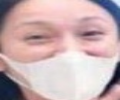

/content/drive/MyDrive/DATASET_MINOR_CSL2050/with_mask/zhouxun/0_0_25.jpg


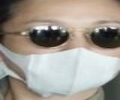

/content/drive/MyDrive/DATASET_MINOR_CSL2050/with_mask/zhouxun/0_0_10.jpg


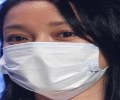

/content/drive/MyDrive/DATASET_MINOR_CSL2050/with_mask/zhouxun/0_0_6.jpg


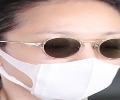

/content/drive/MyDrive/DATASET_MINOR_CSL2050/with_mask/zhouxun/0_0_3.jpg


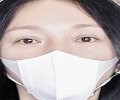

-1


In [4]:
with_mask_img = []

from google.colab.patches import cv2_imshow
i = 0
count = 2200
for folder in os.listdir("/content/drive/MyDrive/DATASET_MINOR_CSL2050/with_mask"):
      if(count<0):
        break
      for file in os.listdir(os.path.join("/content/drive/MyDrive/DATASET_MINOR_CSL2050/with_mask", folder)):
        x = os.path.join("/content/drive/MyDrive/DATASET_MINOR_CSL2050/with_mask", folder)
        path = os.path.join(x, file)
        img = cv2.imread(path)
        resized_image = cv2.resize(img, (120, 100)) 
        with_mask_img.append(resized_image)
        count-=1
        if(i<=4):
          print(path)
          cv2_imshow(resized_image)
          i+=1

print(count)

In [5]:
print(count)

-1


/content/drive/MyDrive/DATASET_MINOR_CSL2050/without_mask/chenzhipeng/1_0_chenzhipeng_0015.jpg


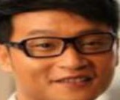

/content/drive/MyDrive/DATASET_MINOR_CSL2050/without_mask/chenzhipeng/1_0_chenzhipeng_0121.jpg


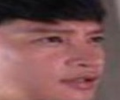

/content/drive/MyDrive/DATASET_MINOR_CSL2050/without_mask/chenzhipeng/1_0_chenzhipeng_0021.jpg


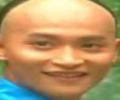

/content/drive/MyDrive/DATASET_MINOR_CSL2050/without_mask/chenzhipeng/1_0_chenzhipeng_0084.jpg


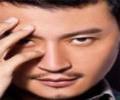

/content/drive/MyDrive/DATASET_MINOR_CSL2050/without_mask/chenzhipeng/1_0_chenzhipeng_0116.jpg


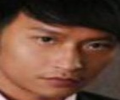

In [6]:
without_mask_img = []

from google.colab.patches import cv2_imshow
i = 0
count = 2000
for folder in os.listdir("/content/drive/MyDrive/DATASET_MINOR_CSL2050/without_mask"):
      if(count<0):
        break
      for file in os.listdir(os.path.join("/content/drive/MyDrive/DATASET_MINOR_CSL2050/without_mask", folder)):
        x = os.path.join("/content/drive/MyDrive/DATASET_MINOR_CSL2050/without_mask", folder)
        path = os.path.join(x, file)
        img = cv2.imread(path)
        resized_image = cv2.resize(img, (120, 100)) 
        without_mask_img.append(resized_image)
        count-=1
        if(i<=4):
          print(path)
          cv2_imshow(resized_image)
          i+=1
      

In [7]:
print(len(with_mask_img))
print(len(without_mask_img))

2201
2160


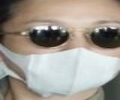

In [9]:
masked = []
for i in with_mask_img:
  masked.append((np.array(i)) )
cv2_imshow(with_mask_img[1])

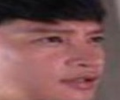

In [10]:
not_masked = []
for i in without_mask_img:
  not_masked.append((np.array(i)) )
cv2_imshow(without_mask_img[1])

In [11]:
label_masked = []
for i in with_mask_img:
  label_masked.append(1)
label_not_masked = []
for i in without_mask_img:
  label_masked.append(0)

In [12]:
data = masked+not_masked
labels = label_masked+label_not_masked

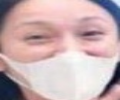

1

In [13]:
cv2_imshow(data[0])
labels[0]

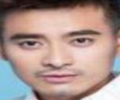

0

In [14]:
cv2_imshow(data[-1])
labels[-1]

## Train-Test Split for Normal Dataset

In [15]:
from sklearn.model_selection import train_test_split

data_train, data_test, label_train, label_test = train_test_split(data, labels, test_size=0.5, random_state=42)

data_train_rav = []
data_test_rav = []
for i in data_train:
  data_train_rav.append(i.ravel())
for i in data_test:
  data_test_rav.append(i.ravel())



## LDA

In [16]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis()
lda_train_data = lda.fit_transform(data_train_rav, label_train)

In [17]:
lda_test_data = lda.transform(data_test_rav)

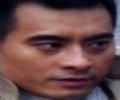

0


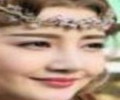

0


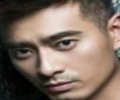

0


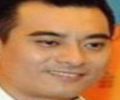

0


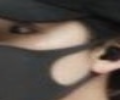

1


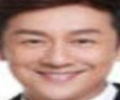

0


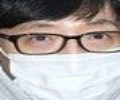

1


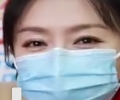

1


In [18]:
for i in range(8):
  cv2_imshow(data_train[i])
  print(label_train[i])

## PCA

In [19]:
from sklearn.decomposition import PCA
pca = PCA(0.95)
pca_train_data=pca.fit_transform(data_train_rav)

In [20]:
pca_test_data=pca.transform(data_test_rav)

# MLP_Normal

In [21]:
from sklearn.neural_network import MLPClassifier

mlp_clf = MLPClassifier()
print()
mlp_clf.fit(data_train_rav, label_train)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [22]:
from sklearn.model_selection import cross_val_score
# mlp_clf_tmp = MLPClassifier()
cvs = cross_val_score(mlp_clf,data_train_rav, label_train,cv=5)
print("Cross-validation score of MLP model is:",cvs)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Cross-validation score of MLP model is: [0.91972477 0.91972477 0.92201835 0.92431193 0.91743119]


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:573: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


In [42]:
print("Testing accuracy:",mlp_clf.score(data_test_rav,label_test))

Testing accuracy: 0.9426868408986704


In [24]:
for i in data_train[0].ravel():
  print(i,end = ' ')

9 2 0 9 2 0 9 2 0 11 1 1 12 1 1 15 1 2 17 1 2 18 2 3 18 2 4 16 2 3 15 3 3 14 3 3 18 6 4 20 8 6 24 12 12 26 14 14 26 15 15 27 17 17 28 19 17 28 18 16 27 17 18 25 16 17 24 16 18 25 14 21 26 14 21 28 15 23 27 14 22 28 14 24 32 17 28 33 19 30 32 19 30 32 21 31 33 22 32 37 25 35 36 23 32 34 19 27 32 18 26 28 16 22 24 13 17 22 11 13 19 8 10 17 7 7 17 8 4 16 7 3 15 5 1 15 5 0 15 5 0 14 3 0 14 3 0 12 3 0 11 1 1 10 1 0 13 1 0 14 3 0 13 3 0 12 4 0 12 5 0 14 6 0 13 7 2 14 9 4 14 9 5 19 9 9 19 8 9 20 9 10 21 8 10 19 6 8 18 5 7 19 5 7 19 5 7 20 6 8 21 7 9 19 5 7 20 6 7 21 7 8 22 9 7 24 8 9 24 8 9 23 7 8 23 7 8 22 7 8 20 6 7 17 5 5 18 6 5 17 4 2 19 4 2 18 3 0 18 4 0 17 3 0 18 4 0 19 4 1 16 4 0 16 4 0 16 4 0 16 4 0 15 3 0 15 3 0 15 2 2 15 2 1 15 3 1 15 2 1 15 2 1 17 2 4 18 3 4 19 4 2 19 5 1 20 7 0 21 8 0 24 11 3 28 14 7 31 16 9 37 18 13 41 20 15 47 25 20 59 35 29 86 61 54 114 86 79 136 107 98 146 116 107 154 124 113 157 125 112 10 2 1 10 2 1 9 1 1 11 1 1 13 2 2 15 2 3 19 3 4 20 4 5 20 4 5 18 3 5 17 5

### MLP_LDA

In [25]:
from sklearn.neural_network import MLPClassifier
mlp_clf_lda = MLPClassifier()
print()
mlp_clf_lda.fit(lda_train_data, label_train)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [27]:
from sklearn.model_selection import cross_val_score
mlp_clf_tmp = MLPClassifier()
cvs = cross_val_score(mlp_clf_tmp,lda_train_data, label_train,cv=5)
print("Cross-validation score of MLP model is:",cvs)

Cross-validation score of MLP model is: [0.99311927 0.99311927 0.98623853 0.99770642 0.99541284]


In [28]:
print("Testing accuracy:",mlp_clf_lda.score(np.array(lda_test_data),label_test))

Testing accuracy: 0.864740944520862


## MLP_PCA

In [29]:
from sklearn.neural_network import MLPClassifier
mlp_clf_pca = MLPClassifier()
print()
mlp_clf_pca.fit(pca_train_data, label_train)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [30]:
from sklearn.model_selection import cross_val_score
cvs = cross_val_score(mlp_clf_pca,pca_train_data, label_train,cv=5)
print("Cross-validation score of MLP model is:",cvs)

Cross-validation score of MLP model is: [0.93119266 0.8853211  0.88073394 0.91284404 0.90366972]


In [31]:
print("Testing accuracy:",mlp_clf_pca.score(pca_test_data,label_test))

Testing accuracy: 0.9147180192572214


# SVC_Normal

In [32]:
from sklearn.svm import SVC

In [33]:

svc_clf = SVC()
print()
svc_clf.fit(data_train_rav, label_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [34]:
from sklearn.model_selection import cross_val_score
cvs = cross_val_score(svc_clf,data_train_rav, label_train,cv=5)
print("Cross-validation score of SVC model is:",cvs)

KeyboardInterrupt: ignored

In [35]:
print("Testing accuracy:",svc_clf.score(data_test_rav,label_test))

Testing accuracy: 0.9683631361760661


## SVC_LDA

In [36]:
svc_clf_lda = SVC()
print()
svc_clf_lda.fit(lda_train_data, label_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [37]:
from sklearn.model_selection import cross_val_score
cvs = cross_val_score(svc_clf_lda,lda_train_data, label_train,cv=5)
print("Cross-validation score of SVC model is:",cvs)

Cross-validation score of SVC model is: [0.99311927 0.99541284 0.98394495 0.99770642 0.99311927]


In [38]:
print("Testing accuracy:",svc_clf_lda.score(lda_test_data,label_test))

Testing accuracy: 0.8624484181568088


## SVC_PCA

In [39]:
svc_clf_pca = SVC()
print()
svc_clf_pca.fit(pca_train_data, label_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [40]:
from sklearn.model_selection import cross_val_score
cvs = cross_val_score(svc_clf_pca,pca_train_data, label_train,cv=5)
print("Cross-validation score of SVC model is:",cvs)

Cross-validation score of SVC model is: [0.97706422 0.96330275 0.93577982 0.95412844 0.95642202]


In [41]:
print("Testing accuracy:",svc_clf_pca.score(pca_test_data,label_test))

Testing accuracy: 0.9679046309032554


# KNN

In [43]:
from sklearn.neighbors import KNeighborsClassifier

In [44]:
knn_clf = KNeighborsClassifier(n_neighbors=3)
knn_clf.fit(data_train_rav, label_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [ ]:
from sklearn.model_selection import cross_val_score
cvs = cross_val_score(knn_clf,data_train_rav, label_train,cv=5)
print("Cross-validation scores of KNN model is:",cvs)

Cross-validation score of KNN models is: [0.90389016 0.90137615 0.89449541 0.89220183 0.89678899]


In [45]:
print("Testing accuracy:",knn_clf.score(data_test_rav,label_test))

Testing accuracy: 0.9046309032553874


## KNN_LDA

In [49]:
knn_clf_lda = KNeighborsClassifier(n_neighbors=3)
knn_clf_lda.fit(lda_train_data, label_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [50]:
from sklearn.model_selection import cross_val_score
knn_tmp = KNeighborsClassifier(n_neighbors=3)
cvs = cross_val_score(knn_tmp,lda_train_data,label_train,cv=5)
print("Cross-validation scores of KNN model with LDA data is:",cvs)

Cross-validation scores of KNN model with LDA data is: [0.99082569 0.99082569 0.98623853 0.99541284 0.99541284]


In [51]:
print("Testing accuracy:",knn_clf_lda.score(lda_test_data,label_test))

Testing accuracy: 0.864740944520862


## KNN_PCA

In [ ]:
knn_clf_pca = KNeighborsClassifier(n_neighbors=3)
knn_clf_pca.fit(pca_train_data, label_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [ ]:
from sklearn.model_selection import cross_val_score
cvs = cross_val_score(knn_clf_pca,pca_train_data,label_train,cv=5)
print("Cross-validation scores of KNN model with PCA data is:",cvs)

Cross-validation scores of KNN model with PCA data is: [0.93348624 0.90366972 0.88990826 0.90137615 0.89678899]


In [ ]:
print("Testing accuracy:",knn_clf_pca.score(pca_test_data,label_test))

Testing accuracy: 0.9151765245300321


# REAL LIFE MASK DETECTION

/content/drive/MyDrive/DATASET_MINOR_CSL2050_REAL_LIFE/0007/0029.jpg


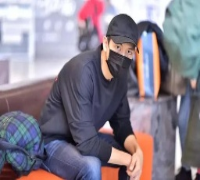

/content/drive/MyDrive/DATASET_MINOR_CSL2050_REAL_LIFE/0007/0019.jpg


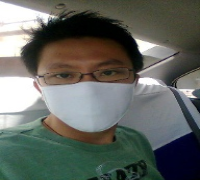

/content/drive/MyDrive/DATASET_MINOR_CSL2050_REAL_LIFE/0007/0007.jpg


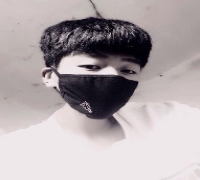

/content/drive/MyDrive/DATASET_MINOR_CSL2050_REAL_LIFE/0007/0028.jpg


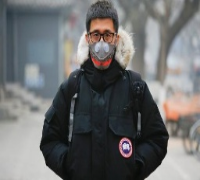

/content/drive/MyDrive/DATASET_MINOR_CSL2050_REAL_LIFE/0007/0027.jpg


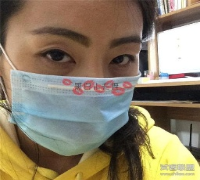

1845


In [46]:
from google.colab.patches import cv2_imshow
i = 0
count = 2500

real_images = []

for folder in os.listdir("/content/drive/MyDrive/DATASET_MINOR_CSL2050_REAL_LIFE"):
      if(count<0):
        break
      for file in os.listdir(os.path.join("/content/drive/MyDrive/DATASET_MINOR_CSL2050_REAL_LIFE", folder)):
        x = os.path.join("/content/drive/MyDrive/DATASET_MINOR_CSL2050_REAL_LIFE", folder)
        path = os.path.join(x, file)
        img = cv2.imread(path)
        resized_image = cv2.resize(img, (200, 180)) 
        real_images.append(resized_image)
        count-=1
        if(i<=4):
          print(path)
          cv2_imshow(resized_image)
          i+=1
      
print(count)

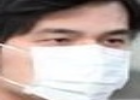

-1

In [ ]:

import cv2

# Load the cascade
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
# Read the input image
img_tmp = with_mask_img[40]



gray = cv2.cvtColor(img_tmp, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, 1.1, 4)


for (x, y, w, h) in faces:
    cv2.rectangle(img_tmp, (x, y), (x+w, y+h), (0, 0, 255), 2)
    faces = img_tmp[y:y + h, x:x + w]
    cv2_imshow(faces)
    # cv2.imwrite('face.jpg', faces)

cv2_imshow(img_tmp)
cv2.waitKey()

In [48]:
! pip install mediapipe

In [ ]:
real_images_prediction_mlp = []
real_images_prediction_svc = []
real_images_prediction_knn = []

In [ ]:
import cv2
import mediapipe as mp
mp_face_detection = mp.solutions.face_detection
mp_drawing = mp.solutions.drawing_utils

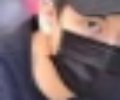

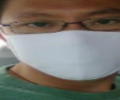

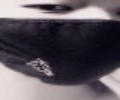

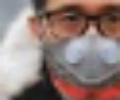

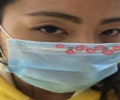

...

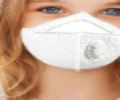

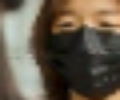

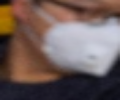

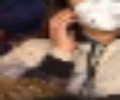

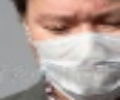

In [ ]:
with mp_face_detection.FaceDetection(
    min_detection_confidence=0.5) as face_detection:
  for i in range(min(100,len(real_images))):
    image = real_images[i]
    d1, d2,_ = image.shape

    results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    if not results.detections:
      real_images_prediction_knn.append(0)
      continue

    annotated_image = image.copy()
    count_knn = 0
    for detection in results.detections:
      x,y,w,h = detection.location_data.relative_bounding_box.xmin,detection.location_data.relative_bounding_box.ymin,detection.location_data.relative_bounding_box.width,detection.location_data.relative_bounding_box.height
      x,y,w,h = int(x*d1),int(y*d2),int(w*d1),int(h*d2)
      if(x>=0 and y>=0 and w>=0 and h>=0):
         crop_img = annotated_image[y:y+h, x:x+w]
         resized_crop_image = cv2.resize(crop_img, (120, 100)) 
         cv2_imshow(resized_crop_image)

         prediction_knn = knn_clf.predict(np.array([resized_crop_image.ravel()]))[0]

        
         count_knn += prediction_knn

      
    
    real_images_prediction_knn.append(count_knn)
    

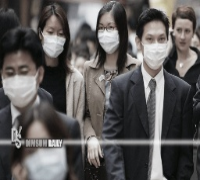

In [ ]:
cv2_imshow(real_images[i])

In [ ]:
print(real_images_prediction_knn)
print(len(real_images_prediction_knn))

[1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 2, 0, 0, 0, 3, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 2, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0]
100


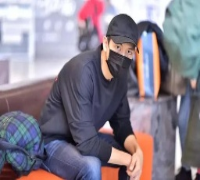

Number of masks detected in this image : 1


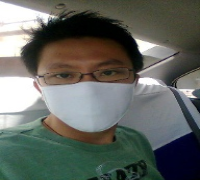

Number of masks detected in this image : 1


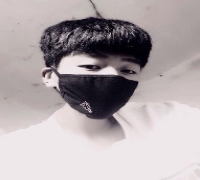

Number of masks detected in this image : 1


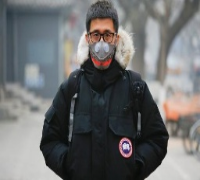

Number of masks detected in this image : 1


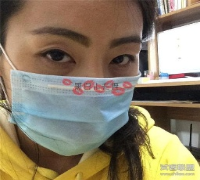

Number of masks detected in this image : 1


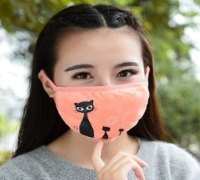

Number of masks detected in this image : 0


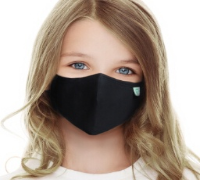

Number of masks detected in this image : 1


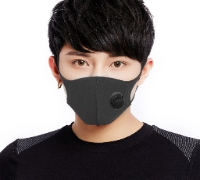

Number of masks detected in this image : 1


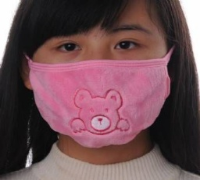

Number of masks detected in this image : 0


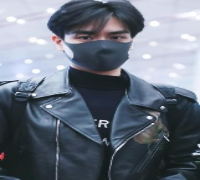

Number of masks detected in this image : 1


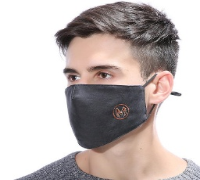

Number of masks detected in this image : 1


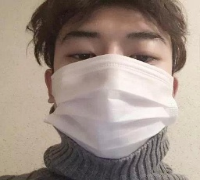

Number of masks detected in this image : 0


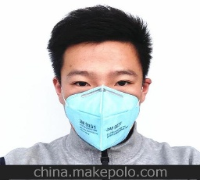

Number of masks detected in this image : 1


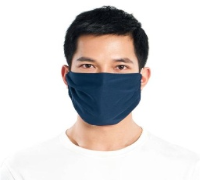

Number of masks detected in this image : 1


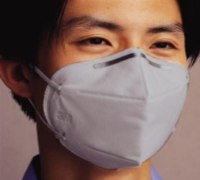

Number of masks detected in this image : 0


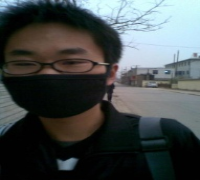

Number of masks detected in this image : 1


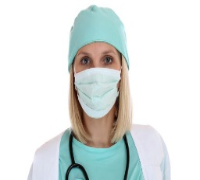

Number of masks detected in this image : 1


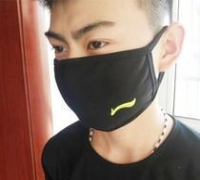

Number of masks detected in this image : 1


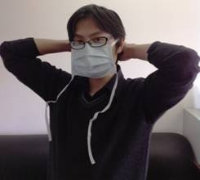

Number of masks detected in this image : 1


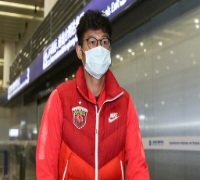

Number of masks detected in this image : 0


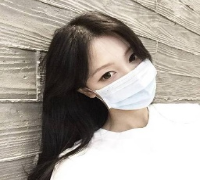

Number of masks detected in this image : 1


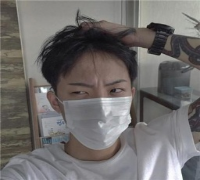

Number of masks detected in this image : 0


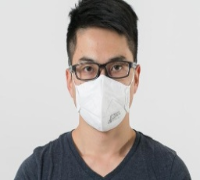

Number of masks detected in this image : 1


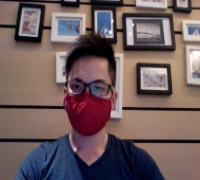

Number of masks detected in this image : 1


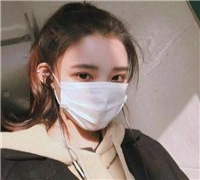

Number of masks detected in this image : 0


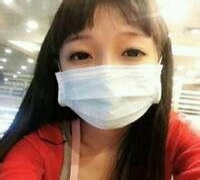

Number of masks detected in this image : 1


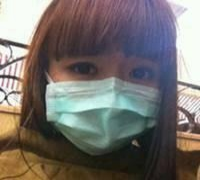

Number of masks detected in this image : 0


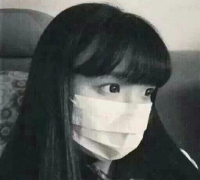

Number of masks detected in this image : 0


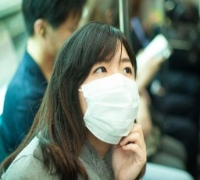

Number of masks detected in this image : 0


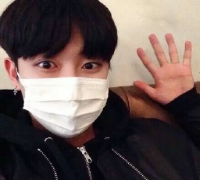

Number of masks detected in this image : 1


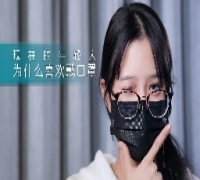

Number of masks detected in this image : 1


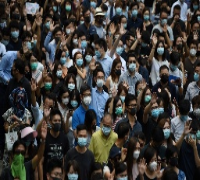

Number of masks detected in this image : 0


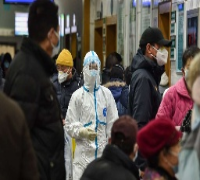

Number of masks detected in this image : 1


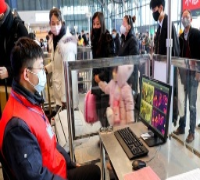

Number of masks detected in this image : 1


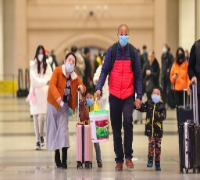

Number of masks detected in this image : 0


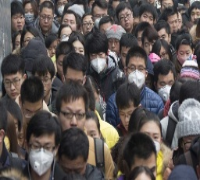

Number of masks detected in this image : 2


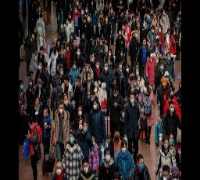

Number of masks detected in this image : 0


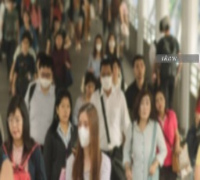

Number of masks detected in this image : 0


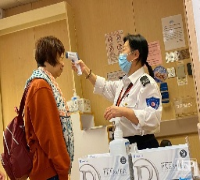

Number of masks detected in this image : 0


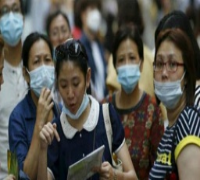

Number of masks detected in this image : 3


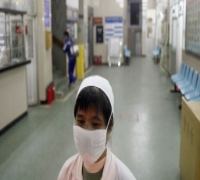

Number of masks detected in this image : 1


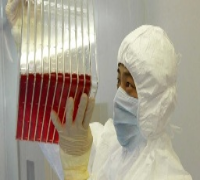

Number of masks detected in this image : 1


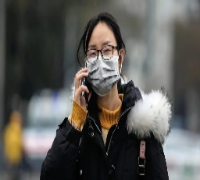

Number of masks detected in this image : 1


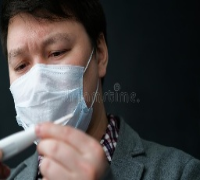

Number of masks detected in this image : 1


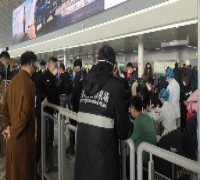

Number of masks detected in this image : 0


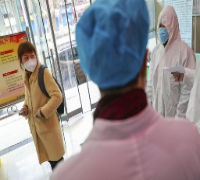

Number of masks detected in this image : 0


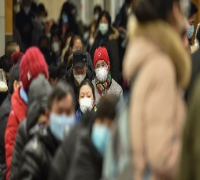

Number of masks detected in this image : 0


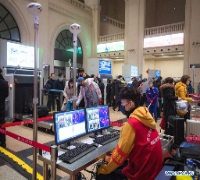

Number of masks detected in this image : 1


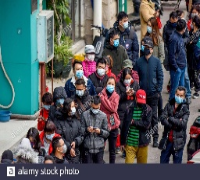

Number of masks detected in this image : 0


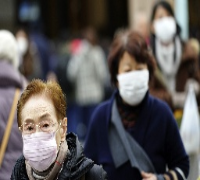

Number of masks detected in this image : 0


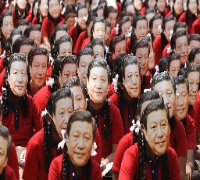

Number of masks detected in this image : 2


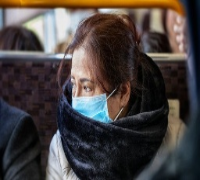

Number of masks detected in this image : 1


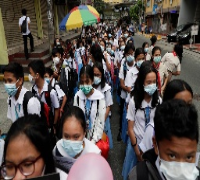

Number of masks detected in this image : 0


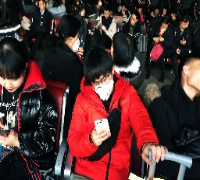

Number of masks detected in this image : 1


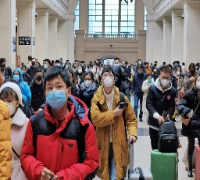

Number of masks detected in this image : 0


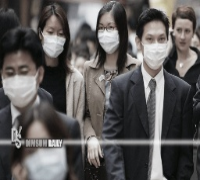

Number of masks detected in this image : 1


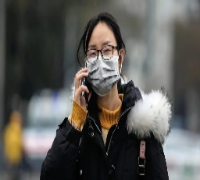

Number of masks detected in this image : 1


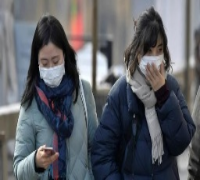

Number of masks detected in this image : 1


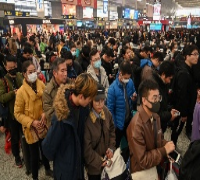

Number of masks detected in this image : 1


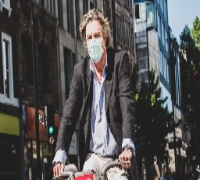

Number of masks detected in this image : 0


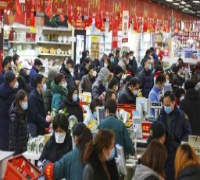

Number of masks detected in this image : 0


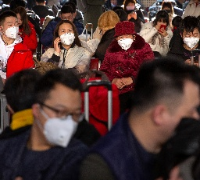

Number of masks detected in this image : 1


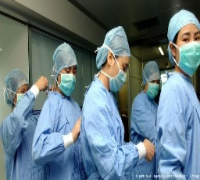

Number of masks detected in this image : 0


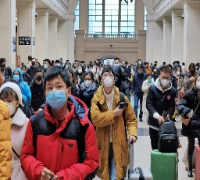

Number of masks detected in this image : 0


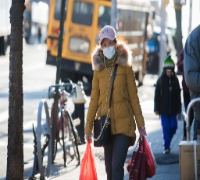

Number of masks detected in this image : 0


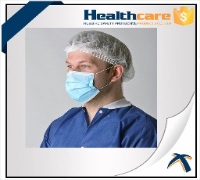

Number of masks detected in this image : 1


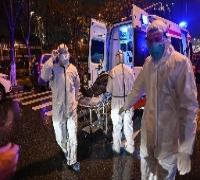

Number of masks detected in this image : 0


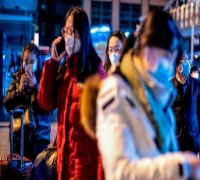

Number of masks detected in this image : 0


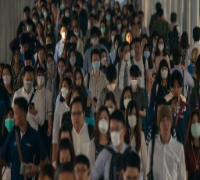

Number of masks detected in this image : 0


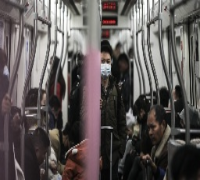

Number of masks detected in this image : 0


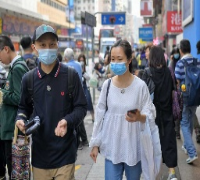

Number of masks detected in this image : 1


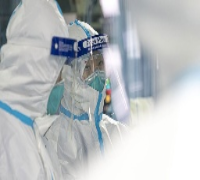

Number of masks detected in this image : 0


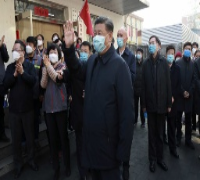

Number of masks detected in this image : 0


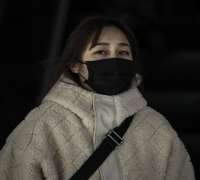

Number of masks detected in this image : 1


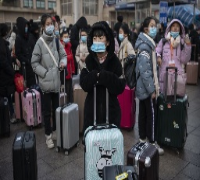

Number of masks detected in this image : 0


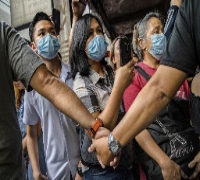

Number of masks detected in this image : 0


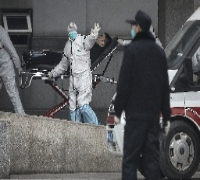

Number of masks detected in this image : 0


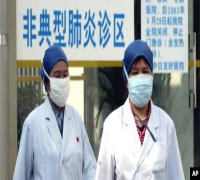

Number of masks detected in this image : 1


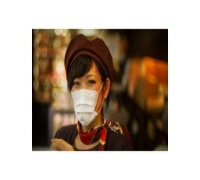

Number of masks detected in this image : 1


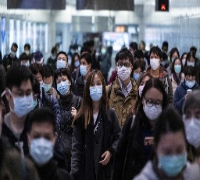

Number of masks detected in this image : 1


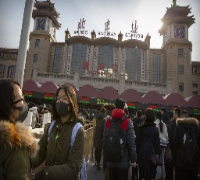

Number of masks detected in this image : 0


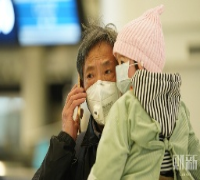

Number of masks detected in this image : 0


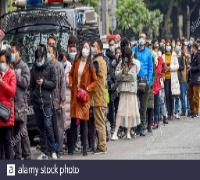

Number of masks detected in this image : 0


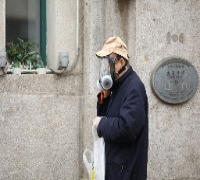

Number of masks detected in this image : 0


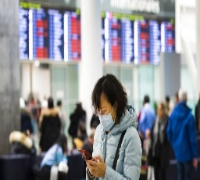

Number of masks detected in this image : 0


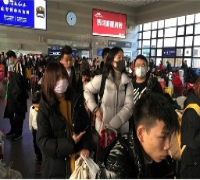

Number of masks detected in this image : 2


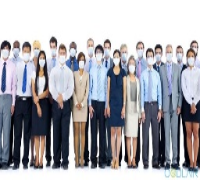

Number of masks detected in this image : 0


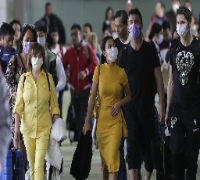

Number of masks detected in this image : 0


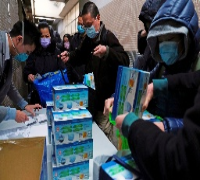

Number of masks detected in this image : 0


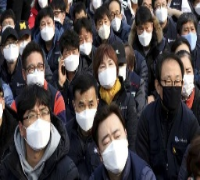

Number of masks detected in this image : 2


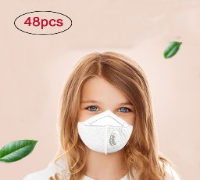

Number of masks detected in this image : 0


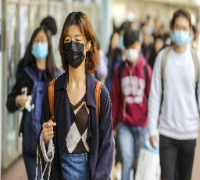

Number of masks detected in this image : 1


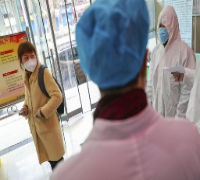

Number of masks detected in this image : 0


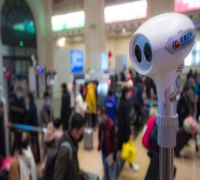

Number of masks detected in this image : 0


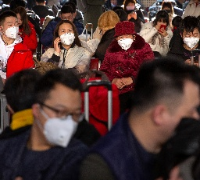

Number of masks detected in this image : 1


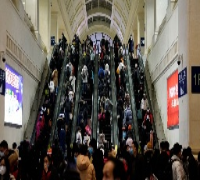

Number of masks detected in this image : 0


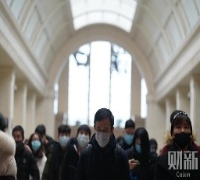

Number of masks detected in this image : 0


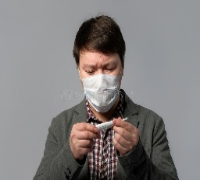

Number of masks detected in this image : 1


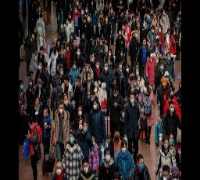

Number of masks detected in this image : 0


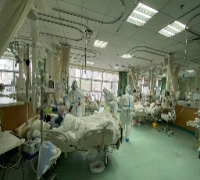

Number of masks detected in this image : 0


In [ ]:
for i in range(min(100,len(real_images))):
  cv2_imshow(real_images[i])
  print("Number of masks detected in this image :",real_images_prediction_knn[i])